Basic exploratory data analysis. Data visualization and QC as well as looking for any obvious patterns.

In [2]:
from pylab import *
import plot_util, terminalplot
import common, tqdm

images = {}
for numpyKey in tqdm.tqdm(common.NUMPY_KEYS):
    im = common.loadNumpy(numpyKey)
    images[numpyKey] = im

100%|██████████| 10/10 [01:14<00:00,  7.48s/it]


Let's plot some histograms of each image and band.

In [3]:
for key, im in images.items():
    for bandno in range(im.shape[2]):
        band = im[:,:,bandno]
        print(key, bandno, band.min(), band.max(), band.mean(), band.std())
        counts, bins = histogram(band,bins=100)
        mdpt = (bins[:-1]+bins[1:])/2.0
        terminalplot.plot(list(mdpt),list(counts))

20170306 0 0.0 20000.0 6133.8184 1257.4557
                        *                                                       
                       *                                                        
                      *  *                                                      
                     *                                                          
                          *                                                     
                    *                                                           
                           *                                                    
                   *                                                            
                           *                                                    
                *                                                               
                   *        *                                                   
               *             *                                    

20170410 0 0.0 20000.0 7675.278 1530.9668
                       *                                                        
                                                                                
                                                                                
                                                                                
                      *                                                         
                       *         **                                             
                                *                                               
                                   *                                            
                        *      *                                                
                                   *                                            
                         *    **                                                
                          ****                                     

20170601 0 0.0 20000.0 8162.474 1759.8269
                               *                                                
                               *                                                
                                *                                               
                                                                                
                              *  *                                              
                       **                                                       
                         *   *    *                                             
                       *  ***                                                   
                           *       *                                            
                                   *                                            
                                                                                
                      *             *                              

20170615 0 0.0 20000.0 8810.516 1973.3759
                                   *                                            
                                   **                                           
                                  *                                             
                         **          *                                          
                        *  *     *                                              
                            *   *     *                                         
                             * *                                                
                       *      **       *                                        
                                       *                                        
                                                                                
                                        *                                       
                                         **                        

20170708 0 0.0 20000.0 8306.191 1543.7578
                                  *                                             
                                 *                                              
                                   *                                            
                                *                                               
                          ***                                                   
                         *   * *   *                                            
                              **                                                
                                                                                
                        *           *                                           
                                                                                
                                     *                                          
                                      *                            

20170807 0 0.0 20000.0 8006.421 1496.2506
                                *                                               
                                 *                                              
                         *     *                                                
                          **      *                                             
                        *   *  *                                                
                             *                                                  
                              *    *                                            
                                                                                
                                                                                
                       *           *                                            
                                                                                
                                    *                              

20170905 0 0.0 20000.0 7031.05 1256.7084
                       *                                                        
                       *                                                        
                      *    **                                                   
                        *  * *                                                  
                         **                                                     
                              *                                                 
                                                                                
                     *                                                          
                               *                                                
                                                                                
                                                                                
                               *                                    

20170923 0 0.0 20000.0 6169.8403 1367.9431
                   *                                                            
                                                                                
                  *    **                                                       
                   *                                                            
                       *                                                        
                    *    *                                                      
                     **                                                         
                          *                                                     
                                                                                
                 *         *                                                    
                                                                                
                           *                                      

20171015 0 0.0 20000.0 6022.231 989.469
                    *                                                           
                   *                                                            
                                                                                
                                                                                
                     **                                                         
                       *                                                        
                       **                                                       
                                                                                
                         *                                                      
                   *                                                            
                                                                                
                          *                                          

20171207 0 0.0 20000.0 4273.0034 758.528
              *                                                                 
               *                                                                
             * *                                                                
                *                                                               
                 *                                                              
                                                                                
                                                                                
                  *                                                             
                                                                                
                                                                                
                                                                                
            *      *                                                

The histograms of each band for each image show that the bands are mostly normally distributed. A few bands are skewed, and/or multimodal, but a normal distribution is a good approximation still.  This also shows that there is some variability in the mean and variance between the bands and different files, which I would expect depending on available illumination, time of year, etc.  We will need to normalize the data before we can use it. The last thing that we learn from these simple histograms is that the clipping value was pretty conservative. A clip of 20,000 is far outside the normal data distribution, and represents true outliers.

Next up are plots of each band for each temporal image.  For these plots, each row represents a single temporal image, and each column is the set of bands for that image (5) each.  These plots are on a common colorbar at first, and then separate colorbars further down.

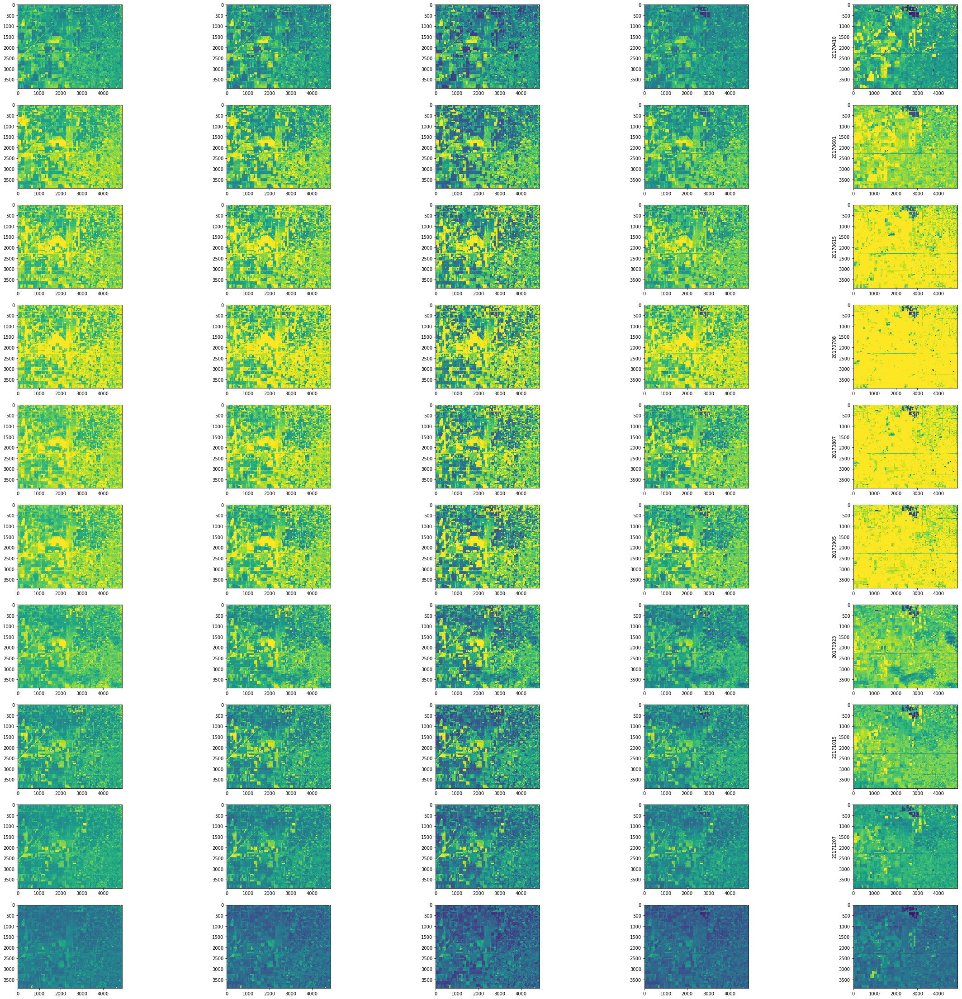

In [5]:
nrows = len(images)
ncols = 5

figure(figsize=(40,40))

k = 0
for key, im in images.items():
    ylabel(key)
    for j in range(ncols):
        k+=1
        subplot(nrows,ncols,k)
        imshow(im[:,:,j],vmax=10000)

Looks pretty clear from this image, where all of the bands are on the same absolute scale, that we're seeing seasonal "brightening" in the images from increased solar illuminance since the summer months are showing significantly brighter images overall.  Unfortunately, I don't know enough about the origin of these images to say for certain what these individual bands actually physically represent, but I suspect that band 5 is probably an infrared band because of the brightening in the summer months.

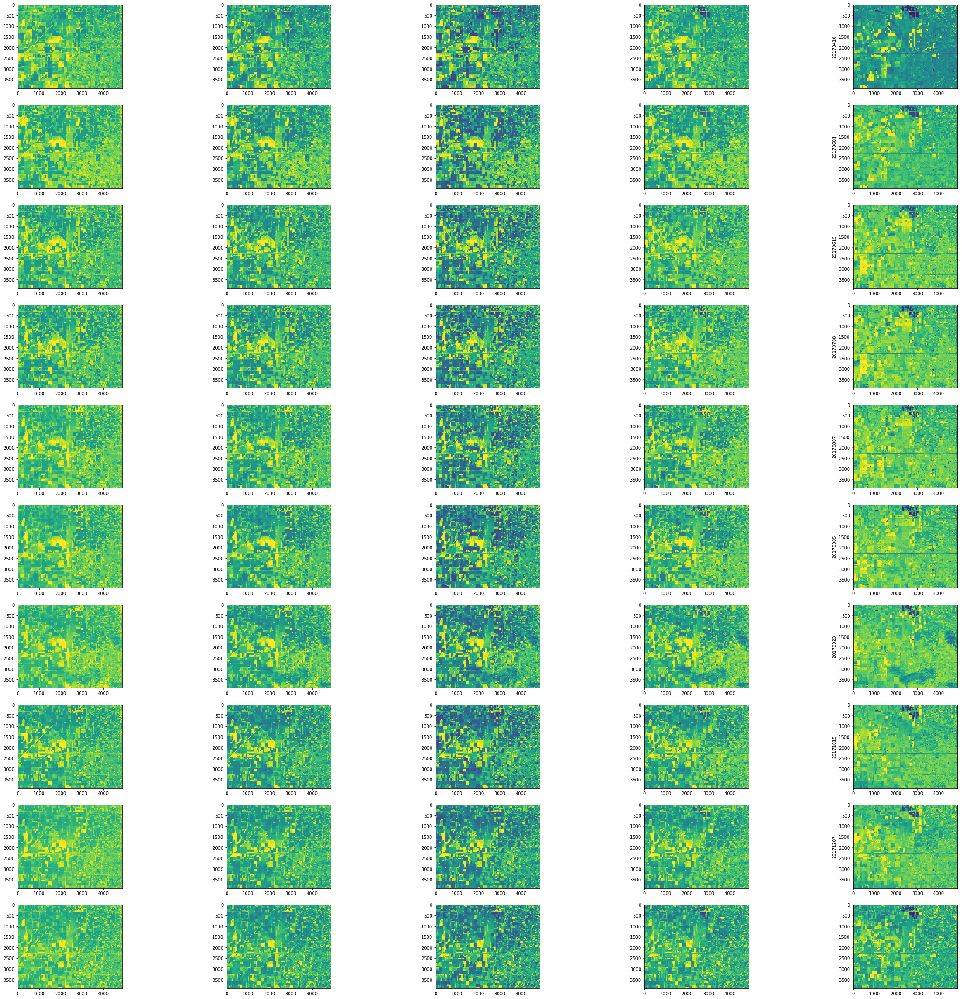

In [6]:
figure(figsize=(40,40))

k = 0

for key, im in images.items():
    ylabel(key)
    for j in range(ncols):
        k+=1
        subplot(nrows,ncols,k)
        imshow(im[:,:,j],vmax=percentile(im[:,:,j],97))

On a relative scale, I'm not seeing as many major discrepancies between the bands, but there are clearly some areas that are changing over time which is a good sign, but I am wondering now whether some of these images are redundant.  Given the timestamps, I would expect that some of them are probably too close temporally to be significant in terms of additional information that they can provide.

Let's take a look at the final class label image that we're going to be trying to replicate. 

In [7]:
labelImage = common.loadNumpy('labels')

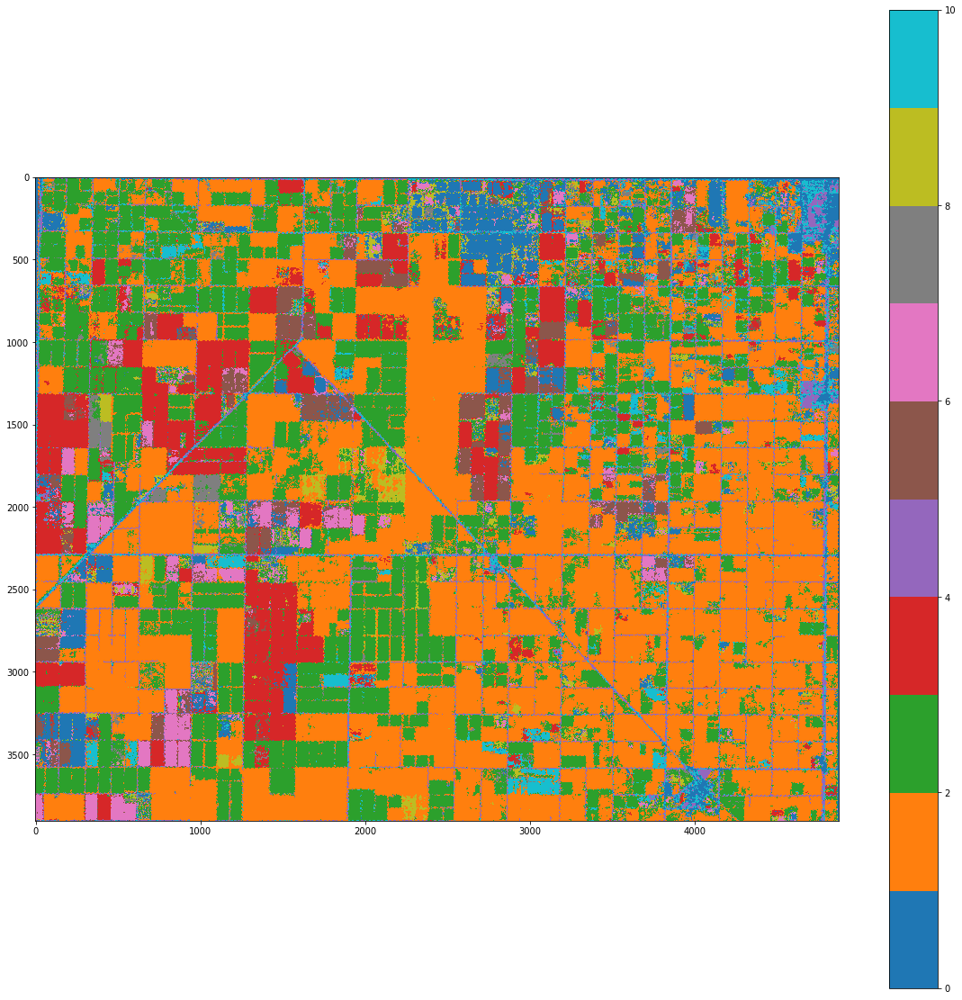

In [8]:
figure(figsize=(20,20))
imshow(labelImage,cmap='tab10')
colorbar()

As we can see, class 1 and class 2 are well distributed spatially. The other classes less so . Remember that class 0 here represents the other 246 classes that we truncated and removed, so these points are considered 'unlabeled'. It's interesting that it looks like the roads themselves are labeled with some mixture of classes, probably due to some error in whatever method is used to generate these labels.  Due to the lack of a uniform spatial distribution of our classes we need to be careful when sampling our data to avoid introducing modeling artifacts due to the lack of representation of some classes in some parts of the image.

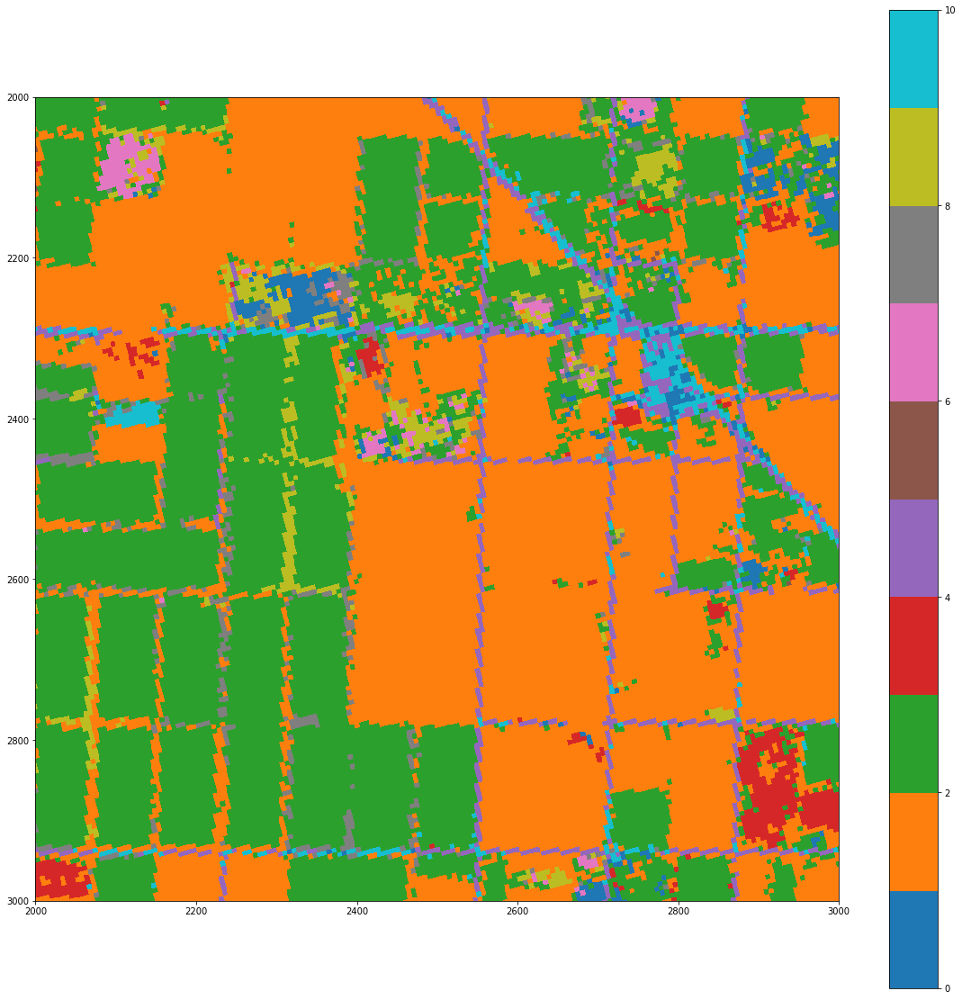

In [9]:
figure(figsize=(20,20))
imshow(labelImage[2000:3000,2000:3000],cmap='tab10', extent=[2000,3000,3000,2000],origin='upper')
colorbar()

Here's a small crop from the center of the image, and it shows that the class labels are not as clean as we originally thought, there is significant class mixing in unlikely areas depending on what the class labels actually mean.

Because of the apparent correlation between some of the images and bands, we need to investigate whether or not any of these channels are redundant or exhibit multicollinearity.  The most straightforward way to check for multicollinearity is to look at the pairwise correlations of the individual bands for each image with every other band from every other image.  A more advanced approach is to try and fit a model to each feature independently using the other features as predictors.

In [10]:
import numpy.random as rmod
h,w = labelImage.shape
selected_idx = rmod.random_integers(0,h*w,100000)

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:3: DeprecationWarning: This function is deprecated. Please call randint(0, 19014446 + 1) instead
  app.launch_new_instance()


In [11]:
data = []
for key, im in images.items():
    for j in range(im.shape[2]):
        fband = im[:,:,j].flatten()
        data.append((key,j,fband[selected_idx]))

In [12]:
import pandas as pd
df = pd.DataFrame()
for row in data:
    key, j, vals = row
    df['{0}_{1:02d}'.format(key,j)] = vals
df['Labels'] = labelImage.flatten()[selected_idx]

In [ ]:
pd.set_option('display.max_columns', 500)

print(df.corr())

In [14]:
import seaborn

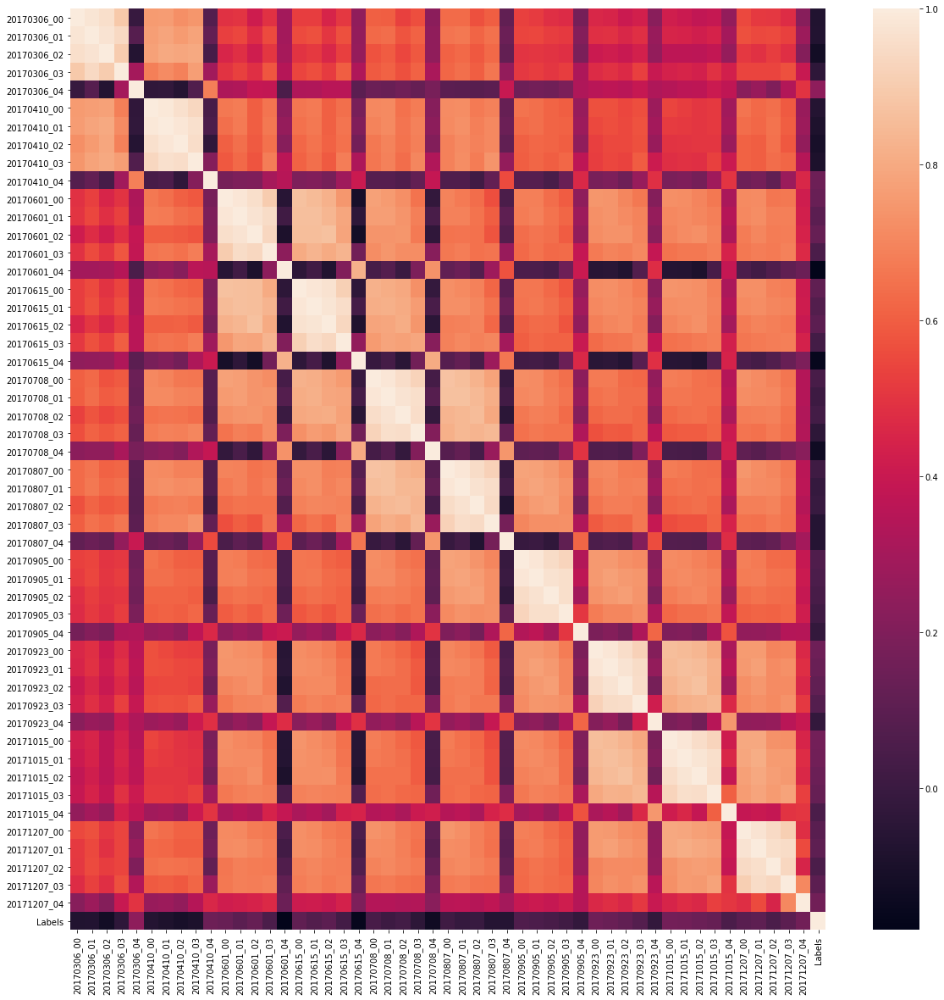

In [16]:
figure(figsize=(20,20))
ax = subplot(111)
seaborn.heatmap(df.corr(),ax=ax)

The heatmap plot of the correlation matrix for all bands for all images is actually more promising then I would've originally thought.  What we see is clearly that the first 4 bands for each image are pretty closely related, which is probably not surprising, especially depending on what kind of bands they are (e.g. if they're something like RGB we would expect them to be strongly correlated). Interestingly, the fifth band on each image is pretty strongly independent of the other 4, so this is kind of adding to the theory that this is a thermal band.  

Another interesting observation here is that the temporal proximity of the images to one another doesn't seem to have too strong of an influence.  For example, while the images on 0601 and 0615 are more strongly correlated than say 0306 and 1015, the correlation is not too strong. The R values for those images are approximately 0.7 which is high, but not terribly high as the R^2 is < 0.5 so clearly there is some unique information there.